# Section 1

**Corner detection (Harris corner method)**

**Q1 : This section you need to show corner of Everest mountain.**

**Q2 : And also show how different of result when you change input paramters in cv2.cornerHarris() function ex. blockSize,ksize. etc.**

In [ ]:
#Everest mountain image data (name: Mount_Everest.jpg)
!gdown "1Bs2jEkGKrzeaUJrv7uWBOtHe4CQGDMHb"

Downloading...
From: https://drive.google.com/uc?id=1Bs2jEkGKrzeaUJrv7uWBOtHe4CQGDMHb
To: /content/Mount_Everest.jpg
100% 353k/353k [00:00<00:00, 106MB/s]


In [ ]:
import numpy as np
from PIL import Image
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import cv2 as cv

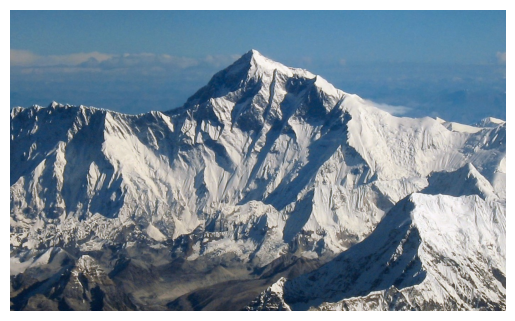

In [ ]:
img_MtEverest= cv.imread('/content/Mount_Everest.jpg')
plt.imshow(img_MtEverest[:,:,::-1])
plt.axis("off")
plt.show()

In [ ]:
#Add your code here!
operatedImage = cv.cvtColor(img_MtEverest, cv.COLOR_BGR2GRAY)
operatedImage = np.float32(operatedImage)

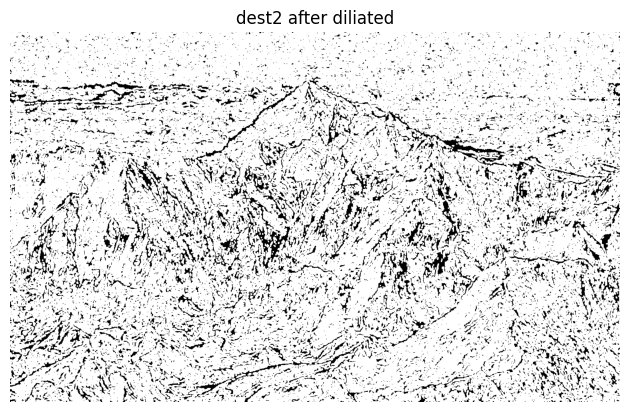

In [ ]:
dest = cv.cornerHarris(operatedImage, 2, 5, 0.07)
dest_dilate = cv.dilate(dest, None)

# Step 9: results of dest diliated
plt.imshow(dest_dilate, cmap='gray', vmin=0, vmax=1)
plt.title('dest2 after diliated')
plt.axis('off')

plt.tight_layout()
plt.show()

## Q1

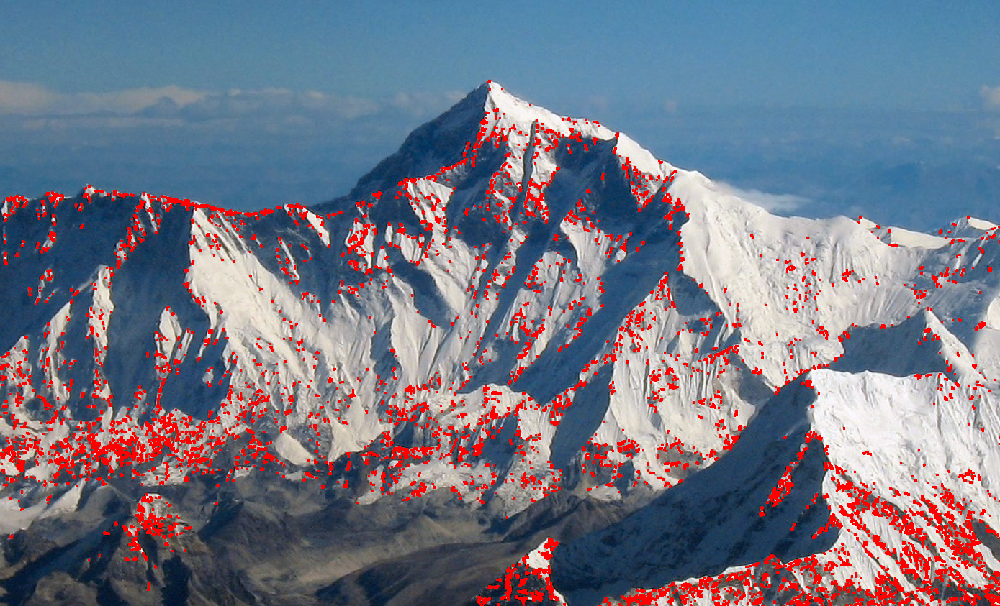

In [ ]:
img = img_MtEverest.copy()
img[dest_dilate > 0.01 * dest_dilate.max()]=[0, 0, 255] #red color
cv2_imshow(img)

## Q2

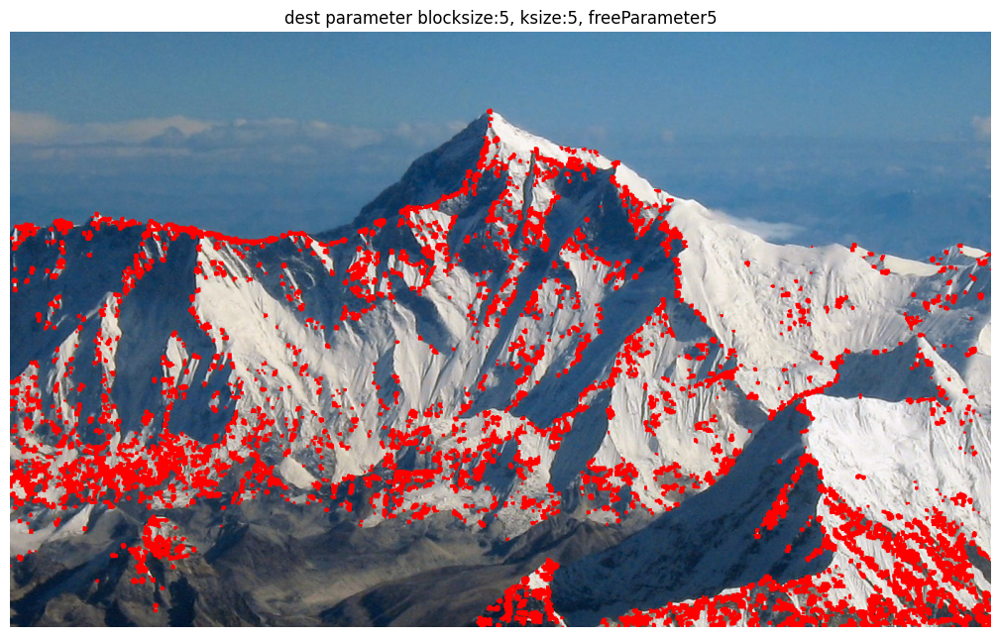

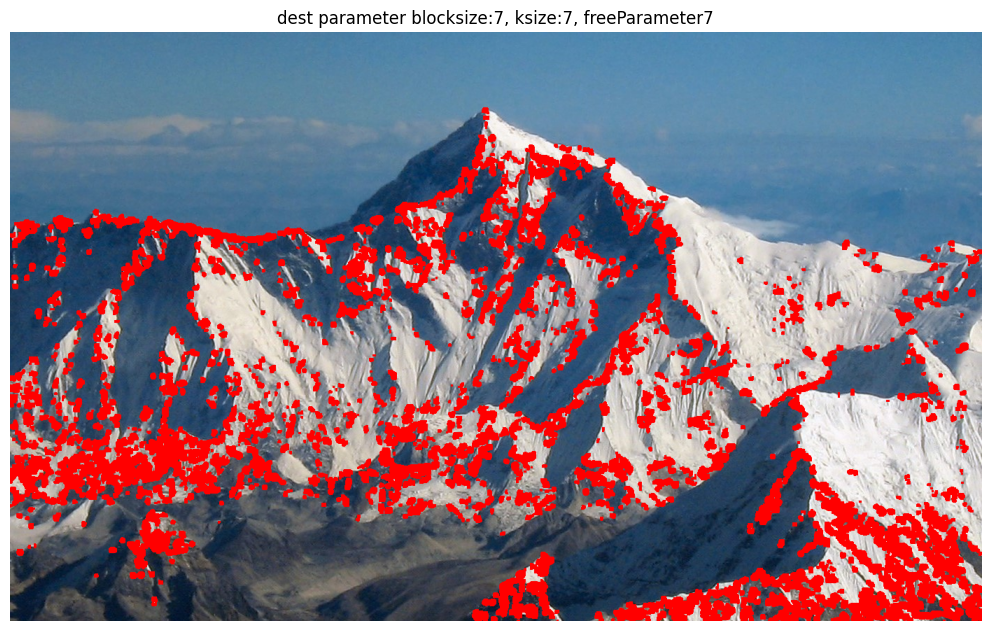

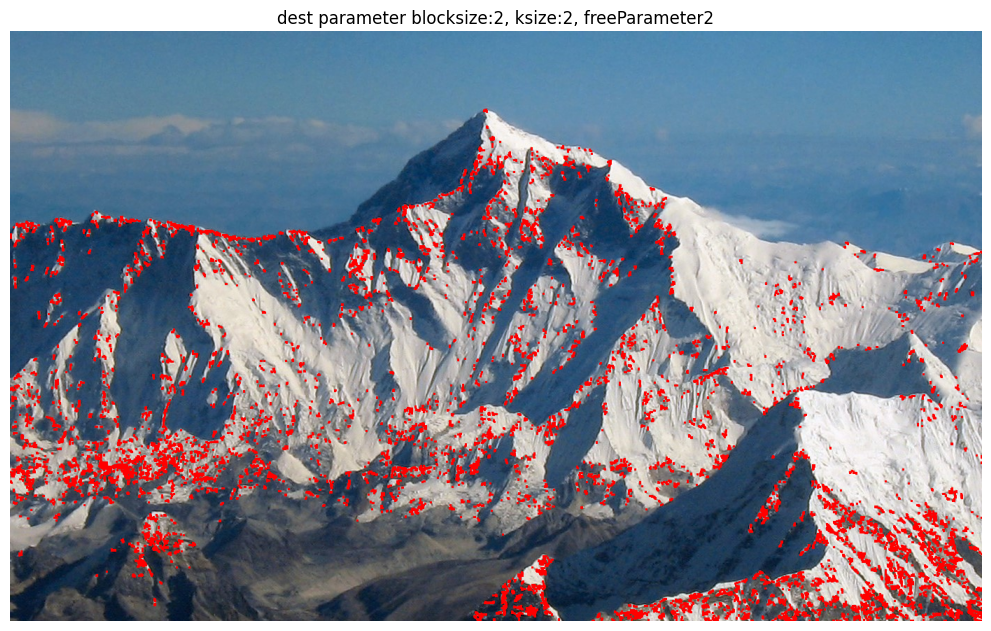

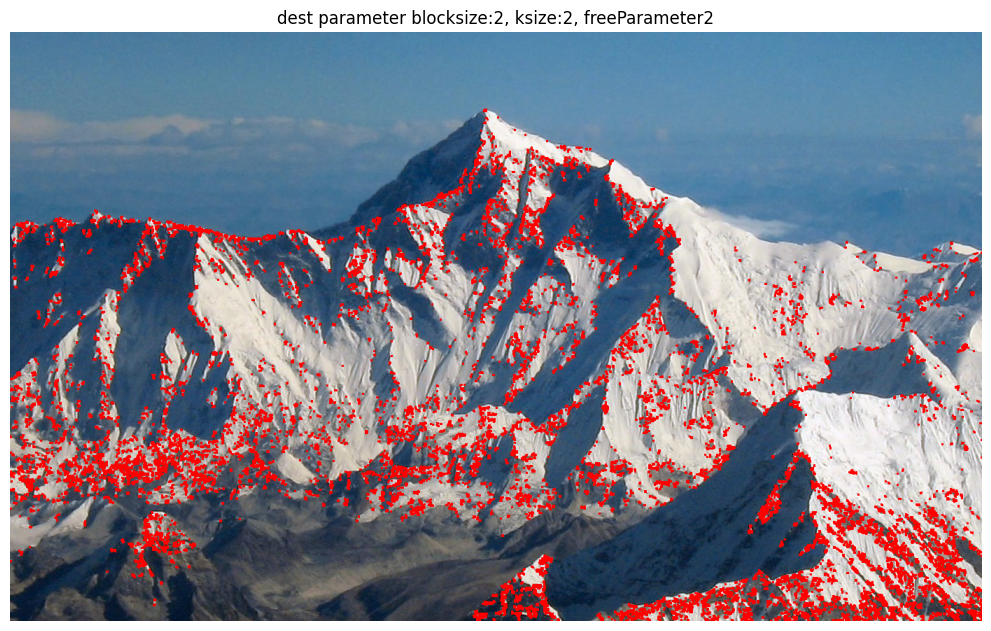

In [ ]:
#------------->blockSize,ksize,freeParameter

dest_b5 =      [ 5, 5, 0.07]
dest_b7 =      [ 7, 5, 0.07]
dest_ksize_7 = [ 2, 7, 0.07]
dest_ksize_1 = [ 2, 1, 0.07]

dests = [dest_b5, dest_b7, dest_ksize_7, dest_ksize_1]

for i,d in enumerate(dests):
  dest = cv.cornerHarris(operatedImage, d[0], d[1], d[2])
  dest_dilate = cv.dilate(dest, None)
  img = img_MtEverest.copy()
  img[dest_dilate > 0.01 * dest_dilate.max()]=[0, 0, 255] #red color
  plt.figure(figsize=(25, 25))
  plt.subplot(len(dests), 1, i+1)
  plt.imshow(img[:,:,::-1])
  plt.title(f'dest parameter blocksize:{d[0]}, ksize:{d[0]}, freeParameter{d[0]}')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

# Section 2
Detecting and visualizing keypoints in two images using SIFT
1. Display and compare the keypoints detected in the two images side by side.
2. Observe and write down the exploration of the results

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
!gdown "1p8Y4QkM_uXRSV_7hGF9b2CwTgsDoAQZz"

Downloading...
From: https://drive.google.com/uc?id=1p8Y4QkM_uXRSV_7hGF9b2CwTgsDoAQZz
To: /content/Notebook01.jpeg
100% 22.7k/22.7k [00:00<00:00, 49.9MB/s]


In [ ]:
!gdown "11tPILvg7f7GY-Nd5r7MckPTYwS3-Mdn5"

Downloading...
From: https://drive.google.com/uc?id=11tPILvg7f7GY-Nd5r7MckPTYwS3-Mdn5
To: /content/Notebook02.jpeg
100% 21.0k/21.0k [00:00<00:00, 48.9MB/s]


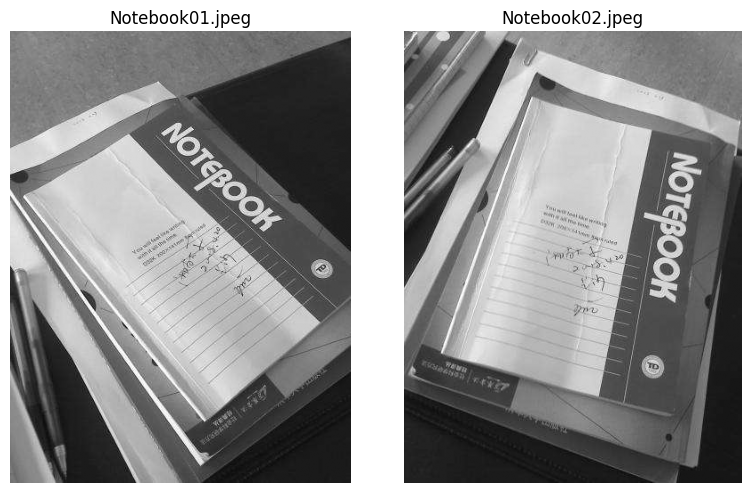

In [ ]:
img1 = cv.imread('/content/Notebook01.jpeg')
img2 = cv.imread('/content/Notebook02.jpeg')

plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)
gray_1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
plt.imshow(gray_1,cmap='gray')
plt.title('Notebook01.jpeg')
plt.axis('off')

plt.subplot(1, 2, 2)
gray_2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
plt.imshow(gray_2,cmap='gray')
plt.title('Notebook02.jpeg')
plt.axis('off')

plt.tight_layout()
plt.show()

## Q2

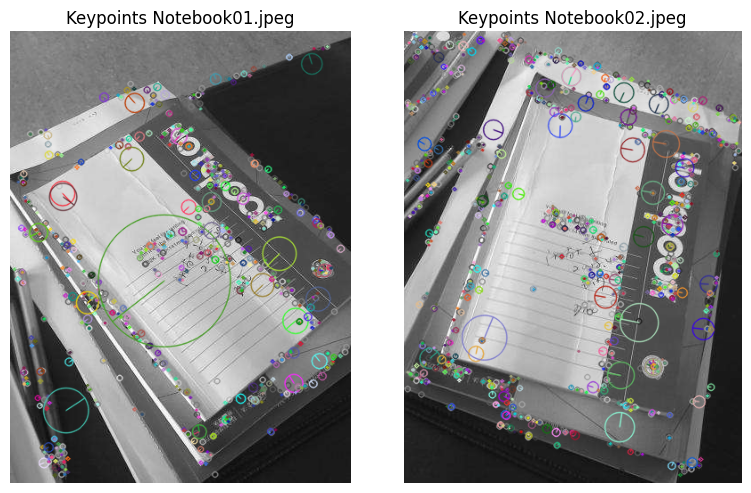

In [ ]:
# Answer your code here
sift = cv.SIFT_create()
kp_1, des = sift.detectAndCompute(gray_1,None)
kp_2, des = sift.detectAndCompute(gray_2,None)

img_k1 = cv.drawKeypoints(gray_1, kp_1, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_k2 = cv.drawKeypoints(gray_2, kp_2, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_k1,cmap='gray')
plt.title('Keypoints Notebook01.jpeg')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_k2,cmap='gray')
plt.title('Keypoints Notebook02.jpeg')
plt.axis('off')

plt.tight_layout()
plt.show()



```
Answer: In 2 images, some group of keypoints have same position on notebook
        so we can use this advantage for find similarity.
```

